In [7]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
from IPython.core.display import display, HTML

#
from tensorflow.keras.callbacks import EarlyStopping

C:\Users\Satyartha Shukla\AppData\Local\Temp\ipykernel_5248\1632561814.py:24: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [8]:
colon_dir=r'F:\extracted_images\lung_colon_image_set\colon_image_sets'
lung_dir=r'F:\extracted_images\lung_colon_image_set\lung_image_sets'
for i,d in enumerate([colon_dir,lung_dir]):
    filepaths=[]
    labels=[]
    classlist=os.listdir(d)
    for klass in classlist:
        classpath=os.path.join(d,klass)
        if os.path.isdir(classpath):
            flist=os.listdir(classpath)
            for f in flist:
                fpath=os.path.join(classpath,f)
                filepaths.append(fpath)
                labels.append(klass)                   
    Fseries= pd.Series(filepaths, name='filepaths')
    Lseries=pd.Series(labels, name='labels')
    if i==0:
        colon_df=pd.concat([Fseries, Lseries], axis=1)
    else:
        lung_df=pd.concat([Fseries, Lseries], axis=1)
df=pd.concat([colon_df, lung_df], axis =0).reset_index(drop=True)# make a combined dataframe
print (df.head())
print(df['labels'].value_counts())

                                           filepaths     labels
0  F:\extracted_images\lung_colon_image_set\colon...  colon_aca
1  F:\extracted_images\lung_colon_image_set\colon...  colon_aca
2  F:\extracted_images\lung_colon_image_set\colon...  colon_aca
3  F:\extracted_images\lung_colon_image_set\colon...  colon_aca
4  F:\extracted_images\lung_colon_image_set\colon...  colon_aca
colon_aca    5000
colon_n      5000
lung_aca     5000
lung_n       5000
lung_scc     5000
Name: labels, dtype: int64


In [9]:
sample_size=5000
sample_list=[]
group=df.groupby('labels')
for label in df['labels'].unique():    
    label_group=group.get_group(label).sample(sample_size, replace=False, random_state=123, axis=0)    
    sample_list.append(label_group)
df=pd.concat(sample_list, axis=0).reset_index(drop=True)
print (len(df))

25000


In [10]:
train_split=.8
test_split=.1
dummy_split=test_split/(1-train_split)
train_df, dummy_df=train_test_split(df, train_size=train_split, shuffle=True, random_state=123)
test_df, valid_df=train_test_split(dummy_df, train_size=dummy_split, shuffle=True, random_state=123)
print ('train_df length: ', len(train_df), ' _test_df length: ', len(test_df), '  valid_df length: ', len(valid_df))

train_df length:  20000  _test_df length:  2500   valid_df length:  2500


In [11]:
#قديم
height=128
width=128
channels=3
batch_size=128
img_shape=(height, width, channels)
img_size=(height, width)
length=len(test_df)
test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]  
test_steps=int(length/test_batch_size)
print ( 'test batch size: ' ,test_batch_size, '  test steps: ', test_steps)


#------------------------------------------------
import cv2
from skimage import io
from matplotlib import pyplot as plt
def scalar(img):
    #path="../input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg"
    #img = img[...,::-1] # Added
    #img = cv2.imread(img)
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    lab_img= cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab_img)
    #plt.hist(l.flat, bins=100, range=(0,255))
    #plt.show()
    equ = cv2.equalizeHist(l)
    updated_lab_img1 = cv2.merge((equ,a,b))
    hist_eq_img = cv2.cvtColor(updated_lab_img1, cv2.COLOR_LAB2BGR)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    clahe_img = clahe.apply(l)
    updated_lab_img2 = cv2.merge((clahe_img,a,b))
    CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
    return CLAHE_img/127.5-1  # scale pixel between -1 and +1
#return img/127.5-1  # scale pixel between -1 and +1
#------------------------------------------------

gen=ImageDataGenerator(preprocessing_function=scalar)
train_gen=gen.flow_from_dataframe( train_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=True, batch_size=batch_size)
test_gen=gen.flow_from_dataframe( test_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=False, batch_size=test_batch_size)
valid_gen=gen.flow_from_dataframe( valid_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=False, batch_size=batch_size)
classes=list(train_gen.class_indices.keys())
class_count=len(classes)

test batch size:  50   test steps:  50


C:\Users\Satyartha Shukla\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


Found 20000 validated image filenames belonging to 5 classes.
Found 2500 validated image filenames belonging to 5 classes.
Found 2500 validated image filenames belonging to 5 classes.


In [12]:
import cv2
import numpy as np
from PIL import Image
def myFunc(image):
    img = np.array(image)
    print(img.shape)
    lab_img= cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab_img)
    #plt.hist(l.flat, bins=100, range=(0,255))
    #plt.show()
    equ = cv2.equalizeHist(l)
    updated_lab_img1 = cv2.merge((equ,a,b))
    hist_eq_img = cv2.cvtColor(updated_lab_img1, cv2.COLOR_LAB2BGR)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    clahe_img = clahe.apply(l)
    updated_lab_img2 = cv2.merge((clahe_img,a,b))
    CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
    #return CLAHE_img/127.5-1  # scale pixel between -1 and +1
    return Image.fromarray(CLAHE_img )
#myFunc('../input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg')
from tensorflow.keras.preprocessing import image

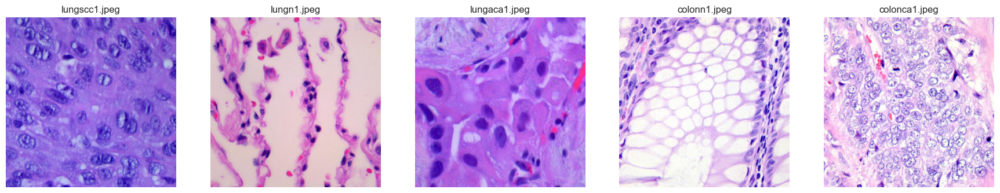

In [13]:
from tensorflow.keras.preprocessing import image
SAMPLES = ['F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_scc/lungscc1.jpeg',
           'F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_n/lungn1.jpeg', 
           'F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca1.jpeg',
           'F:/extracted_images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg', 
           'F:/extracted_images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg']

plt.figure(figsize=(22, 10)) 
global c
c = 0

for i in SAMPLES:
    plt.subplot(1, 5, c + 1)
    c += 1
    t = i.split('/')
    plt.title(t[5])
    plt.imshow(image.load_img(i))
    plt.axis('off')
plt.show()

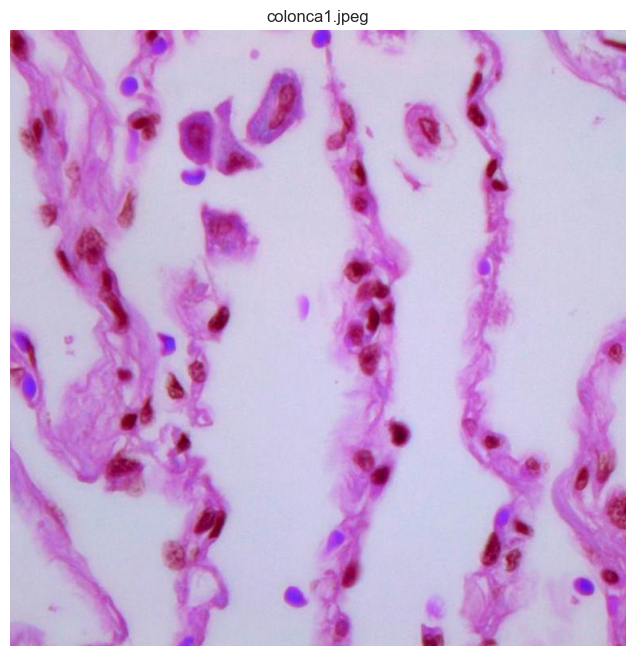

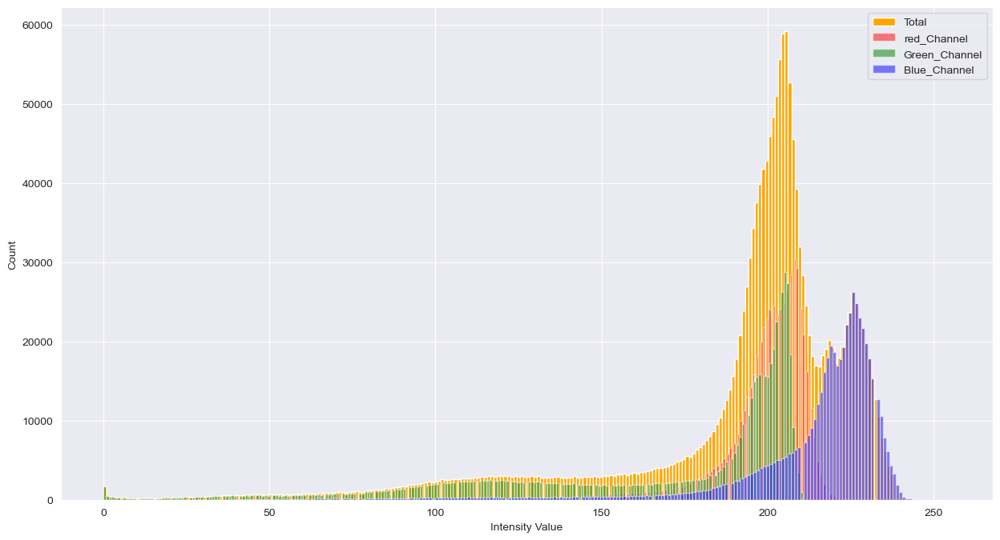

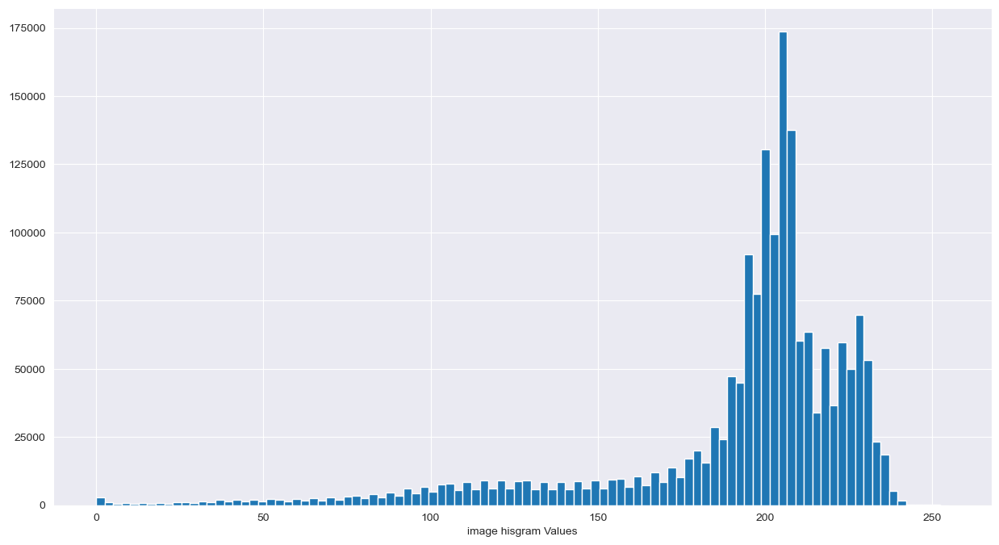

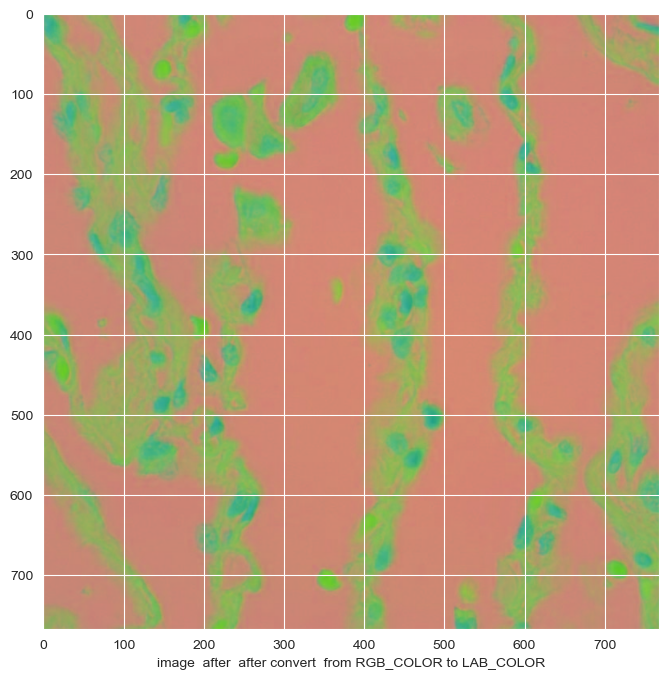

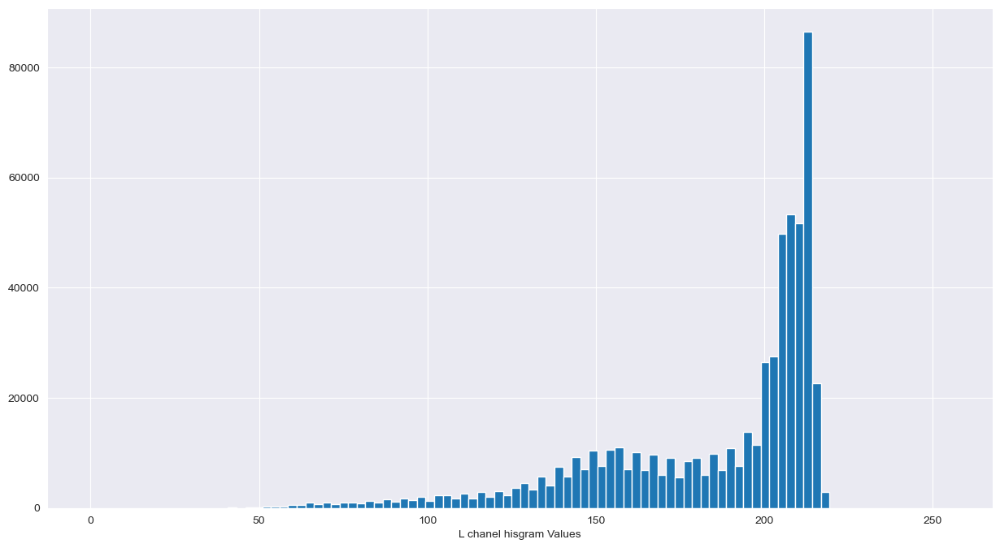

...

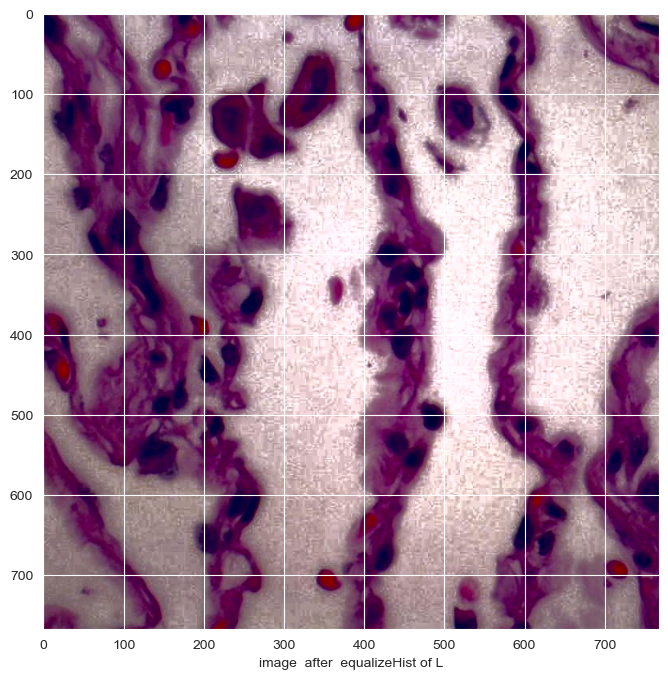

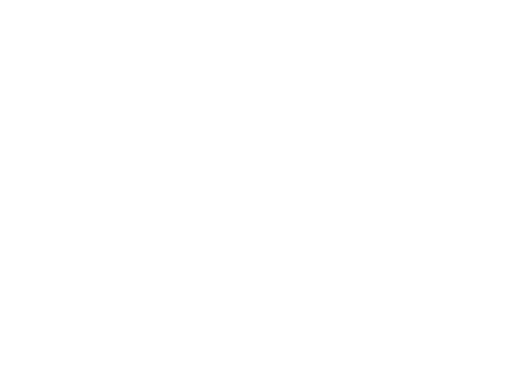

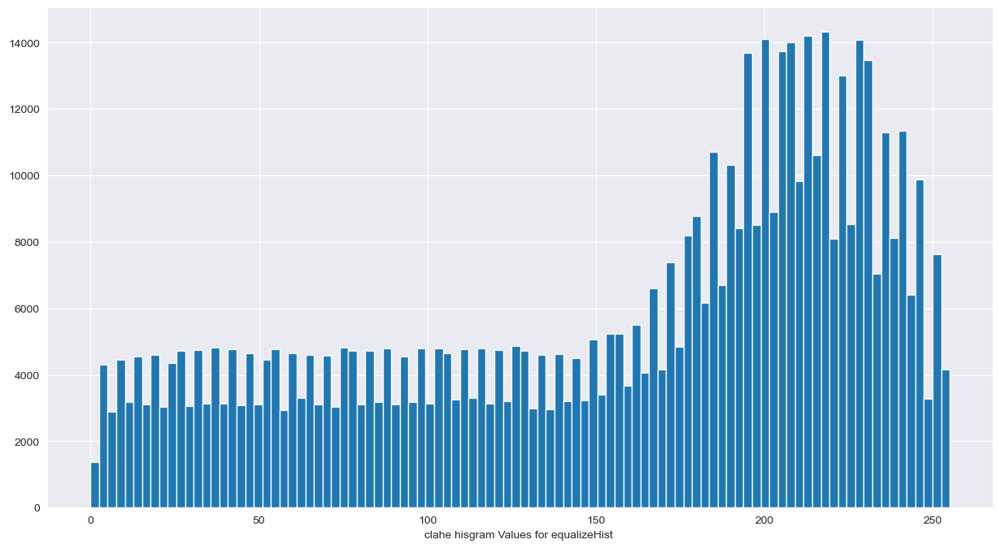

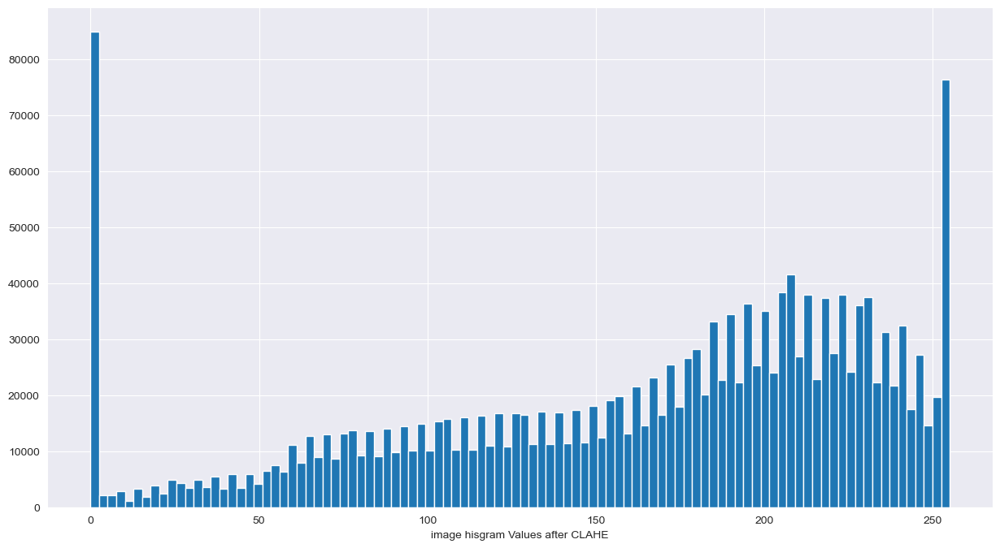

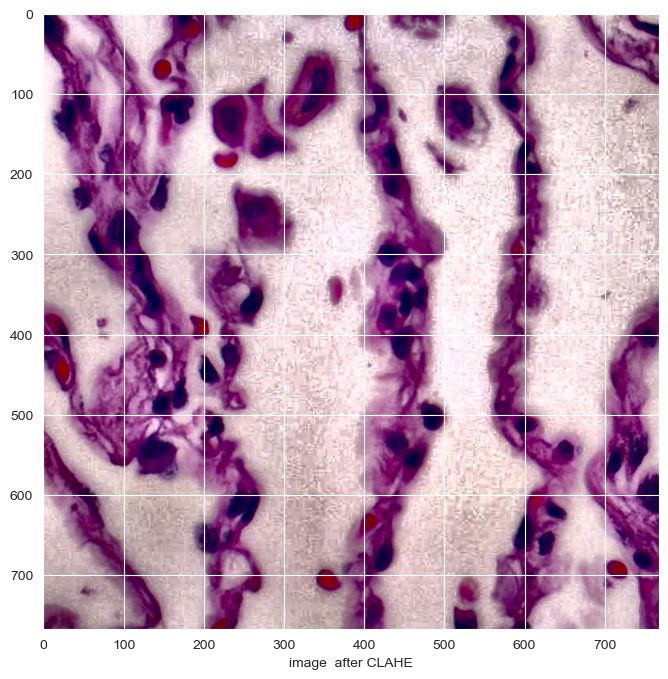

(0.0, 1.0, 0.0, 1.0)

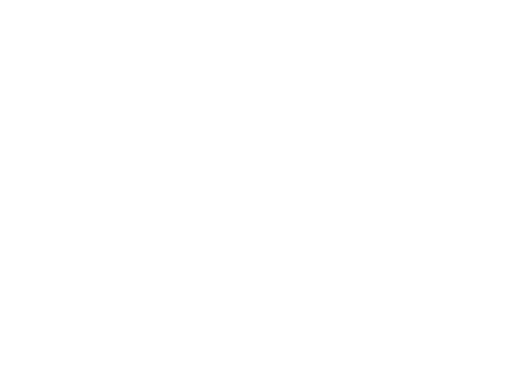

In [14]:
from tensorflow.keras.preprocessing import image
import cv2
import numpy as np
from PIL import Image
image= 'F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_n/lungn1.jpeg' 
SAMPLES = ['F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_scc/lungscc1.jpeg',
           'F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_n/lungn1.jpeg', 
           'F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca1.jpeg',
           'F:/extracted_images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg', 
           'F:/extracted_images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg']

SAMPLES = ['F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_scc/lungscc1.jpeg']
plt.figure(figsize=(15, 8))
t = i.split('/')
plt.title(t[5])
#image=image.load_img(i)
image=cv2.imread(image)
plt.imshow(image)
plt.axis('off')
    
plt.figure(figsize=(15, 8))  
plt.hist(image.ravel(), bins = 256, color = 'orange', )   
plt.hist(image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Total', 'red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()
        
plt.figure(figsize=(15, 8))
h1=plt.hist(image.flat, bins=100, range=(0,255))
plt.xlabel('image hisgram Values')
plt.show() 
    
img = np.array(image)
    
plt.figure(figsize=(15, 8))
lab_img= cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
plt.imshow(lab_img)
plt.xlabel('image  after  after convert  from RGB_COLOR to LAB_COLOR')    
plt.show()
    
plt.figure(figsize=(15, 8))
l, a, b = cv2.split(lab_img)
h2=plt.hist(l.flat, bins=100, range=(0,255))
plt.xlabel('L chanel hisgram Values')
plt.show() 
    
plt.figure(figsize=(15, 8))
equ = cv2.equalizeHist(l)
h3=plt.hist(equ.flat, bins=100, range=(0,255))
plt.xlabel(' equalizeHist of L chanel hisgram Values')
plt.show() 
    
plt.figure(figsize=(15, 8))
updated_lab_img1 = cv2.merge((equ,a,b))
hist_eq_img = cv2.cvtColor(updated_lab_img1, cv2.COLOR_LAB2BGR)
h4=plt.hist(hist_eq_img.flat, bins=100, range=(0,255))
plt.xlabel('image hisgram Values after  equalizeHist of L')
plt.show() 
    
plt.figure(figsize=(15, 8))
plt.imshow(hist_eq_img)
plt.xlabel('image  after  equalizeHist of L')    
plt.show()
plt.axis('off')

    
plt.figure(figsize=(15, 8))
clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8,8))
clahe_img = clahe.apply(equ)
h5=plt.hist(clahe_img.flat, bins=100, range=(0,255))
plt.xlabel('clahe hisgram Values for equalizeHist ')
plt.show() 
    
plt.figure(figsize=(15, 8))
updated_lab_img2 = cv2.merge((clahe_img,a,b))
CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
h6=plt.hist(CLAHE_img.flat, bins=100, range=(0,255))
plt.xlabel('image hisgram Values after CLAHE')    
plt.show() 
    
plt.figure(figsize=(15, 8))
plt.imshow(CLAHE_img)
plt.xlabel('image  after CLAHE')    
plt.show()
plt.axis('off')


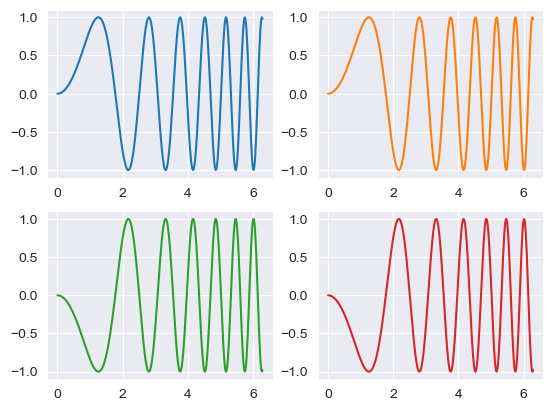

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# Some example data to display
x = np.linspace(0, 2 * np.pi, 400)
y = np.sin(x ** 2)
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(x, y)
axs[0, 1].plot(x, y, 'tab:orange')
axs[1, 0].plot(x, -y, 'tab:green')
axs[1, 1].plot(x, -y, 'tab:red')

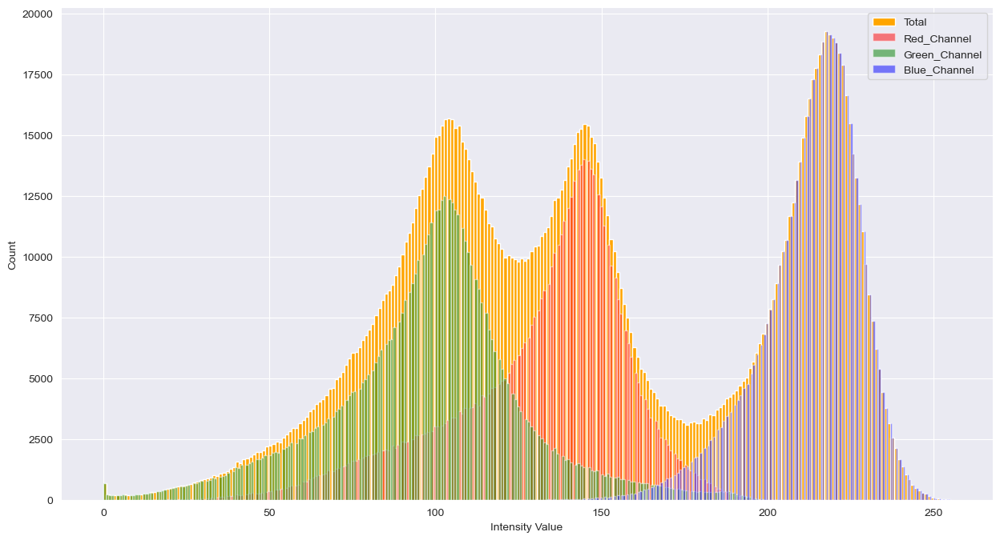

In [16]:
from skimage import io
import matplotlib.pyplot as plt
image = io.imread('F:/extracted_images/lung_colon_image_set/lung_image_sets/lung_scc/lungscc1.jpeg')

plt.figure(figsize=(15, 8))

_ = plt.hist(image.ravel(), bins = 256, color = 'orange', )
_ = plt.hist(image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()


In [17]:
height=128
width=128
channels=3
batch_size=128
img_shape=(height, width, channels)
img_size=(height, width)
length=len(test_df)
test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]  
test_steps=int(length/test_batch_size)
print ( 'test batch size: ' ,test_batch_size, '  test steps: ', test_steps)
gen=ImageDataGenerator()
train_gen=gen.flow_from_dataframe( train_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=True, batch_size=batch_size,preprocessing_function = myFunc
)
test_gen=gen.flow_from_dataframe( test_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=False, batch_size=test_batch_size,    preprocessing_function = myFunc
)
valid_gen=gen.flow_from_dataframe( valid_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=False, batch_size=batch_size,preprocessing_function = myFunc
)
classes=list(train_gen.class_indices.keys())
class_count=len(classes)

test batch size:  50   test steps:  50
Found 20000 validated image filenames belonging to 5 classes.
Found 2500 validated image filenames belonging to 5 classes.
Found 2500 validated image filenames belonging to 5 classes.


In [18]:
def show_image_samples(gen ):
    test_dict=test_gen.class_indices
    classes=list(test_dict.keys())    
    images,labels=next(gen) # get a sample batch from the generator 
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<25:   #show maximum of 25 images
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        #image=(images[i]+1 )/2 # scale images between 0 and 1 becaue pre-processor set them between -1 and +1
        plt.imshow(images[i]/255)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=16)
        plt.axis('off')
    plt.show()

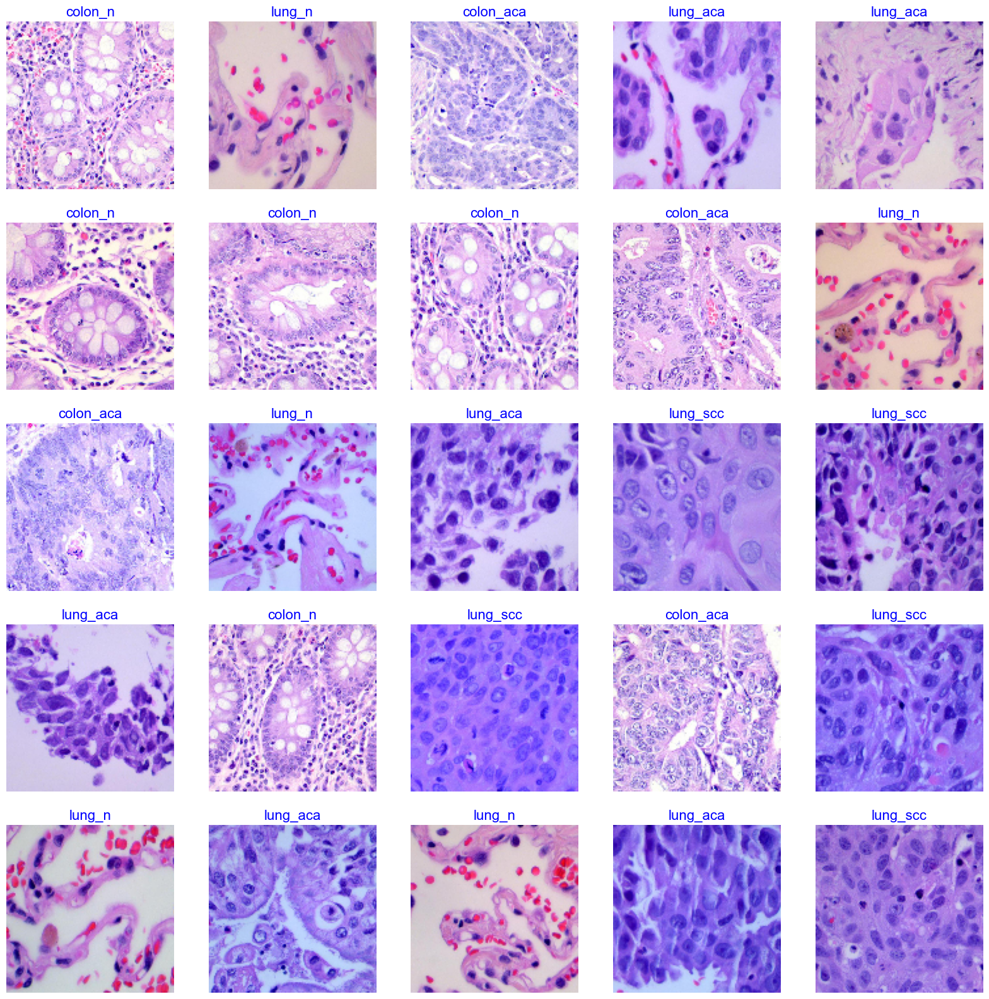

In [19]:
show_image_samples(train_gen)

In [20]:
def print_in_color(txt_msg,fore_tupple,back_tupple,):
    #prints the text_msg in the foreground color specified by fore_tupple with the background specified by back_tupple 
    #text_msg is the text, fore_tupple is foregroud color tupple (r,g,b), back_tupple is background tupple (r,g,b)
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m' 
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

In [21]:
model_name='InceptionResNetV2'
base_model=tf.keras.applications.InceptionResNetV2(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max') 
x=base_model.output
x=keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
x=Dropout(rate=.45, seed=123)(x)        
output=Dense(class_count, activation='softmax')(x)
model=Model(inputs=base_model.input, outputs=output)
model.compile(Adamax(lr=.001), loss='categorical_crossentropy', metrics=['accuracy']) 

In [22]:
early_stopping=EarlyStopping(monitor='val_loss', patience=3)
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=20,
    callbacks=[early_stopping])
#model.save_weights("model.h5")
model.save("InceptionResNetV2.hd5")
print("Saved model to disk")
#loaded_model.load_weights("model.h5")
#print("Loaded model from disk")

Epoch 1/20
157/157 [==============================] - 4376s 27s/step - loss: 5.0542 - accuracy: 0.9547 - val_loss: 3.5553 - val_accuracy: 0.9096
Epoch 2/20
157/157 [==============================] - 4199s 27s/step - loss: 2.3455 - accuracy: 0.9961 - val_loss: 1.6970 - val_accuracy: 0.9968
Epoch 3/20
157/157 [==============================] - 4211s 27s/step - loss: 1.2725 - accuracy: 0.9984 - val_loss: 0.9461 - val_accuracy: 0.9988
Epoch 4/20
157/157 [==============================] - 4207s 27s/step - loss: 0.7406 - accuracy: 0.9992 - val_loss: 0.5524 - val_accuracy: 0.9996
Epoch 5/20
157/157 [==============================] - 4224s 27s/step - loss: 0.4580 - accuracy: 0.9995 - val_loss: 0.3578 - val_accuracy: 0.9996
Epoch 6/20
157/157 [==============================] - 4211s 27s/step - loss: 0.3058 - accuracy: 0.9993 - val_loss: 0.2558 - val_accuracy: 0.9976
Epoch 7/20
157/157 [==============================] - 6051s 39s/step - loss: 0.2251 - accuracy: 0.9985 - val_loss: 0.1807 - val_ac

INFO:tensorflow:Assets written to: InceptionResNetV2.hd5\assets


Saved model to disk


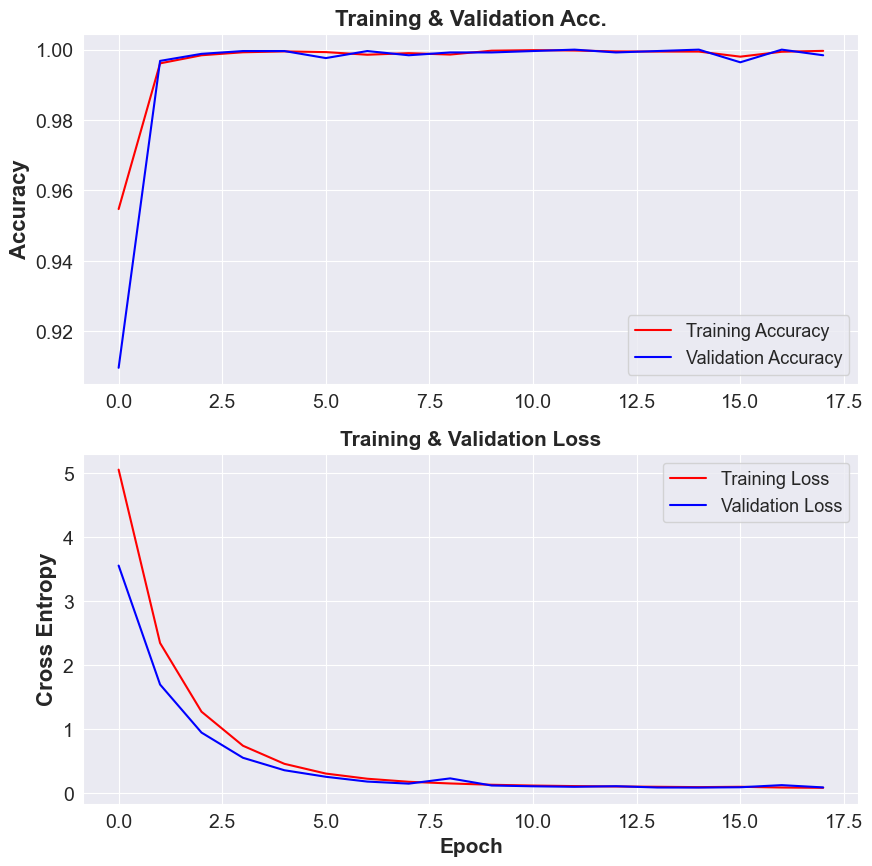

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)

plt.plot(acc, label='Training Accuracy', color='r')
plt.plot(val_acc, label='Validation Accuracy', color='b')


plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='lower right', fontsize=13)
plt.ylabel('Accuracy', fontsize=16, weight='bold')
plt.title('Training & Validation Acc.', fontsize=16, weight='bold')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss', color='r')
plt.plot(val_loss, label='Validation Loss', color='b')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=13)
plt.ylabel('Cross Entropy', fontsize=16, weight='bold')
plt.title('Training & Validation Loss', fontsize=15, weight='bold')
plt.xlabel('Epoch', fontsize=15, weight='bold')
plt.show()


In [24]:
from sklearn.metrics import classification_report

Y_pred = model.predict(test_gen)
y_pred = np.argmax(Y_pred, axis=1)

print(classification_report(test_gen.labels, y_pred))

50/50 [==============================] - 138s 3s/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       479
           1       1.00      1.00      1.00       519
           2       1.00      0.99      1.00       488
           3       1.00      1.00      1.00       498
           4       0.99      1.00      1.00       516

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



Confusion matrix, without normalization


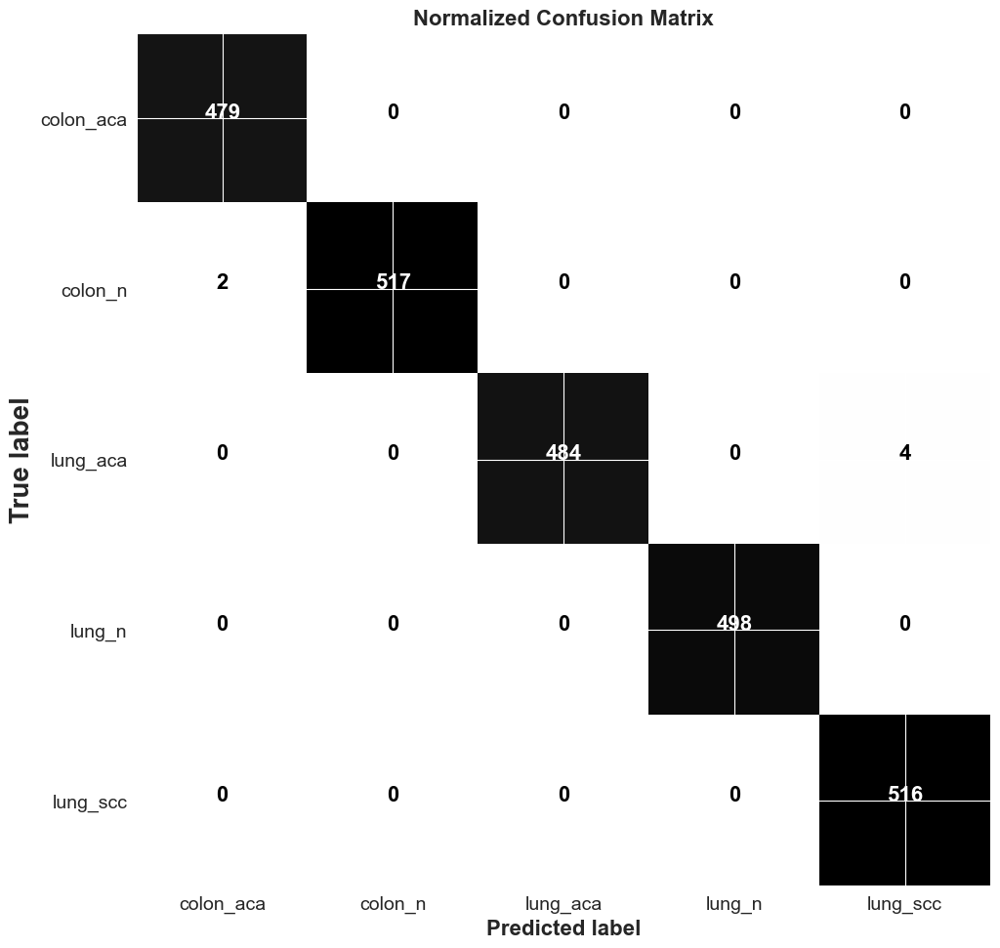

In [25]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Greys):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, weight='bold', fontsize=16)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=14)
    plt.yticks(tick_marks, classes, fontsize=14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center", fontsize=16, weight='bold',
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=20, weight='bold')
    plt.xlabel('Predicted label', fontsize=16, weight='bold')

# Compute confusion matrix
cnf_matrix = confusion_matrix(test_gen.labels, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(10, 10))
plot_confusion_matrix(cnf_matrix, classes=['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc'],normalize=False,
                      title='Normalized Confusion Matrix')
plt.show()

In [26]:
from sklearn.metrics import classification_report
Y_pred = model.predict(valid_gen)
y_pred = np.argmax(Y_pred, axis=1)
l=np.array(valid_gen.labels)
#print(y_pred,l)
print(classification_report(l, y_pred))

20/20 [==============================] - 117s 6s/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       508
           1       1.00      1.00      1.00       480
           2       1.00      0.99      1.00       492
           3       1.00      1.00      1.00       514
           4       0.99      1.00      1.00       506

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [27]:
from sklearn.metrics import classification_report
Y_pred = model.predict(valid_gen)
y_pred = np.argmax(Y_pred, axis=1)
l=np.array(valid_gen.labels)
#print(y_pred,l)
print(classification_report(l, y_pred))

20/20 [==============================] - 119s 6s/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       508
           1       1.00      1.00      1.00       480
           2       1.00      0.99      1.00       492
           3       1.00      1.00      1.00       514
           4       0.99      1.00      1.00       506

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [28]:
from keras.models import load_model
EfficientNetB0= load_model("InceptionResNetV2.hd5")

Confusion matrix, without normalization


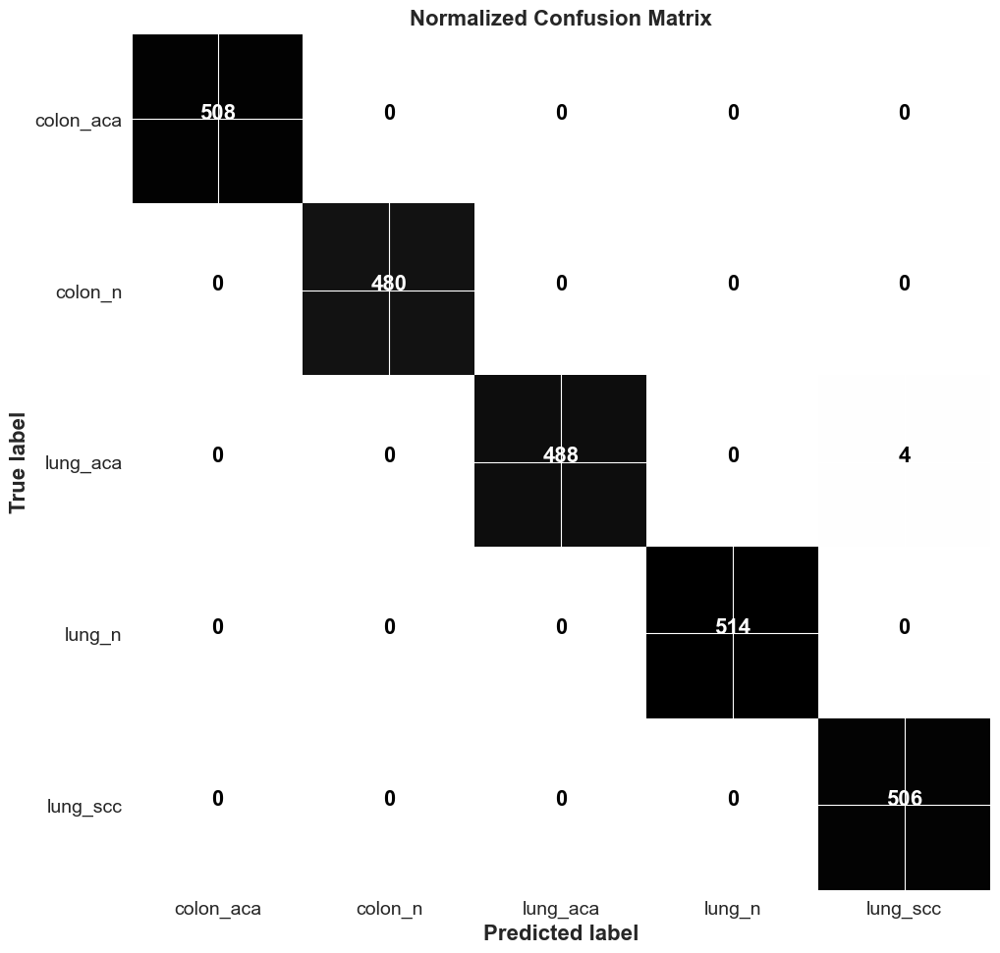

In [29]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Greys):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("qNormalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, weight='bold', fontsize=16)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=14)
    plt.yticks(tick_marks, classes, fontsize=14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center", fontsize=16, weight='bold',
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16, weight='bold')
    plt.xlabel('Predicted label', fontsize=16, weight='bold')

# Compute confusion matrix
cnf_matrix = confusion_matrix(valid_gen.labels, y_pred)
np.set_printoptions(precision=4)

# Plot non-normalized confusion matrix
plt.figure(figsize=(10, 10))
plot_confusion_matrix(cnf_matrix, classes=['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc'],normalize=False,
                      title='Normalized Confusion Matrix')
plt.show()

In [30]:
model_name='EfficientNetB0'
base_model=tf.keras.applications.EfficientNetB0(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max') 
x=base_model.output
x=keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
x=Dropout(rate=.45, seed=123)(x)        
output=Dense(class_count, activation='softmax')(x)
model=Model(inputs=base_model.input, outputs=output)
model.compile(Adamax(lr=.001), loss='categorical_crossentropy', metrics=['accuracy'])

16705208/16705208 [==============================] - 18s 1us/step


In [31]:
early_stopping=EarlyStopping(monitor='val_loss', patience=3)
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=30,
    callbacks=[early_stopping])
model.save("EfficientNetB0.hd5")
model.save_weights("model.h5")
print("Saved model to disk")
loaded_model.load_weights("model.h5")
print("Loaded model from disk")

Epoch 1/30
157/157 [==============================] - 1496s 9s/step - loss: 4.6668 - accuracy: 0.9499 - val_loss: 2.5423 - val_accuracy: 0.9628
Epoch 2/30
157/157 [==============================] - 1443s 9s/step - loss: 1.6096 - accuracy: 0.9906 - val_loss: 0.9519 - val_accuracy: 0.9972
Epoch 3/30
157/157 [==============================] - 1440s 9s/step - loss: 0.6803 - accuracy: 0.9961 - val_loss: 0.4391 - val_accuracy: 0.9992
Epoch 4/30
157/157 [==============================] - 1435s 9s/step - loss: 0.3543 - accuracy: 0.9978 - val_loss: 0.2493 - val_accuracy: 0.9996
Epoch 5/30
157/157 [==============================] - 1426s 9s/step - loss: 0.2307 - accuracy: 0.9983 - val_loss: 0.1748 - val_accuracy: 0.9992
Epoch 6/30
157/157 [==============================] - 1434s 9s/step - loss: 0.1824 - accuracy: 0.9983 - val_loss: 0.1447 - val_accuracy: 0.9992
Epoch 7/30
157/157 [==============================] - 1993s 13s/step - loss: 0.1554 - accuracy: 0.9986 - val_loss: 0.1267 - val_accuracy

INFO:tensorflow:Assets written to: EfficientNetB0.hd5\assets


Saved model to disk


NameError: name 'loaded_model' is not defined

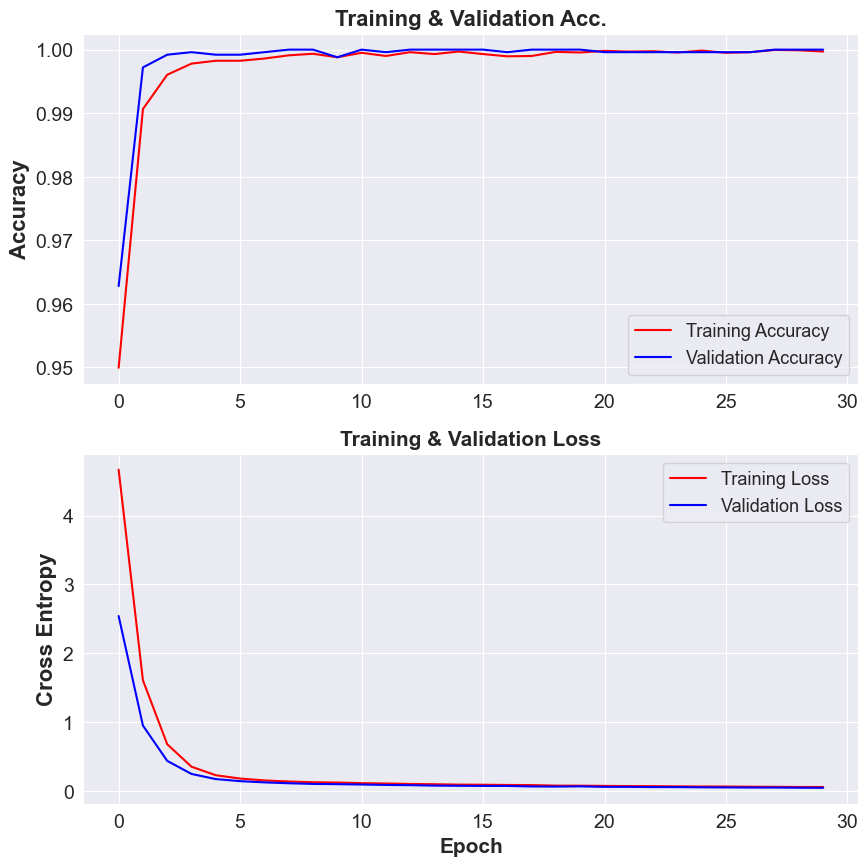

In [32]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)

plt.plot(acc, label='Training Accuracy', color='r')
plt.plot(val_acc, label='Validation Accuracy', color='b')


plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='lower right', fontsize=13)
plt.ylabel('Accuracy', fontsize=16, weight='bold')
plt.title('Training & Validation Acc.', fontsize=16, weight='bold')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss', color='r')
plt.plot(val_loss, label='Validation Loss', color='b')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=13)
plt.ylabel('Cross Entropy', fontsize=16, weight='bold')
plt.title('Training & Validation Loss', fontsize=15, weight='bold')
plt.xlabel('Epoch', fontsize=15, weight='bold')
plt.show()

In [33]:
from sklearn.metrics import classification_report

Y_pred = model.predict(test_gen)
y_pred = np.argmax(Y_pred, axis=1)

print(classification_report(test_gen.labels, y_pred))

50/50 [==============================] - 81s 2s/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       479
           1       1.00      1.00      1.00       519
           2       1.00      1.00      1.00       488
           3       1.00      1.00      1.00       498
           4       1.00      1.00      1.00       516

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



Confusion matrix, without normalization


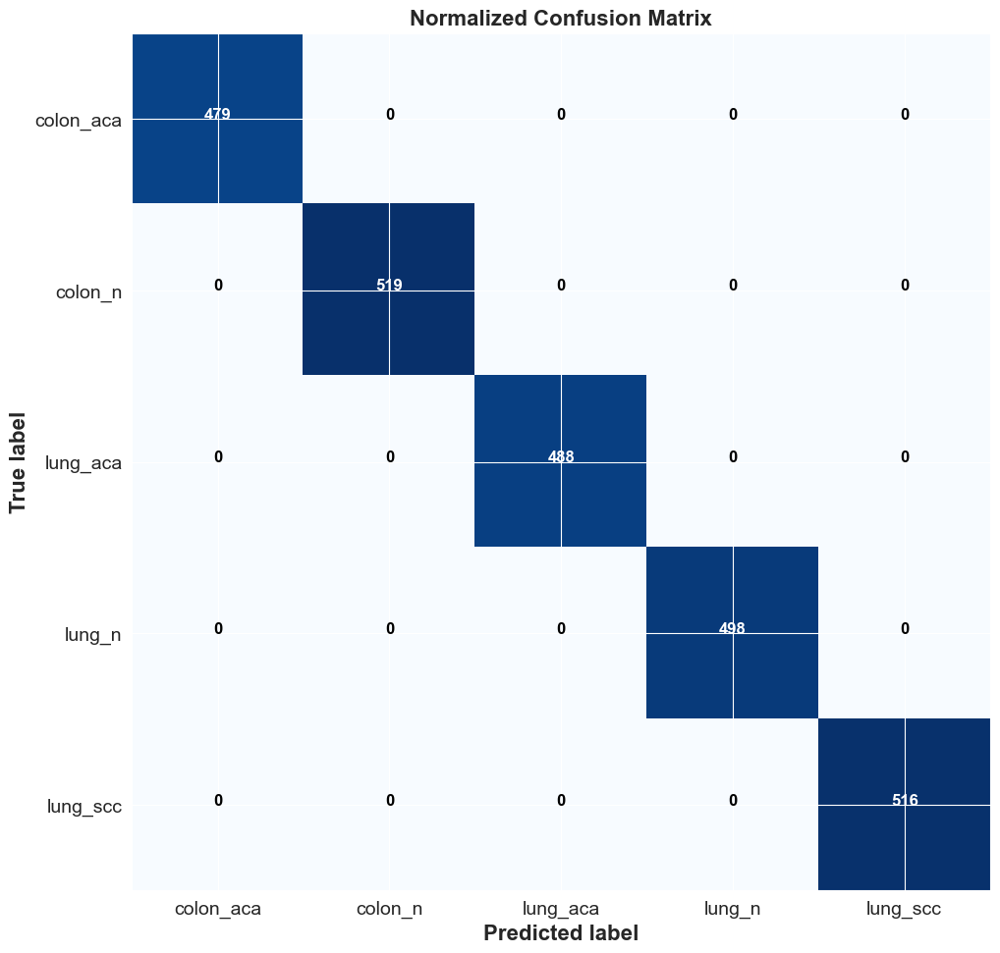

In [34]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, weight='bold', fontsize=16)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=14)
    plt.yticks(tick_marks, classes, fontsize=14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center", fontsize=12, weight='bold',
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16, weight='bold')
    plt.xlabel('Predicted label', fontsize=16, weight='bold')

# Compute confusion matrix
cnf_matrix = confusion_matrix(test_gen.labels, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(10, 10))
plot_confusion_matrix(cnf_matrix, classes=['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc'],normalize=False,
                      title='Normalized Confusion Matrix')
plt.show()

In [35]:
from sklearn.metrics import classification_report
Y_pred = model.predict(valid_gen)
y_pred = np.argmax(Y_pred, axis=1)
l=np.array(valid_gen.labels)
#print(y_pred,l)
print(classification_report(l, y_pred))

20/20 [==============================] - 57s 3s/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       508
           1       1.00      1.00      1.00       480
           2       1.00      1.00      1.00       492
           3       1.00      1.00      1.00       514
           4       1.00      1.00      1.00       506

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



Confusion matrix, without normalization


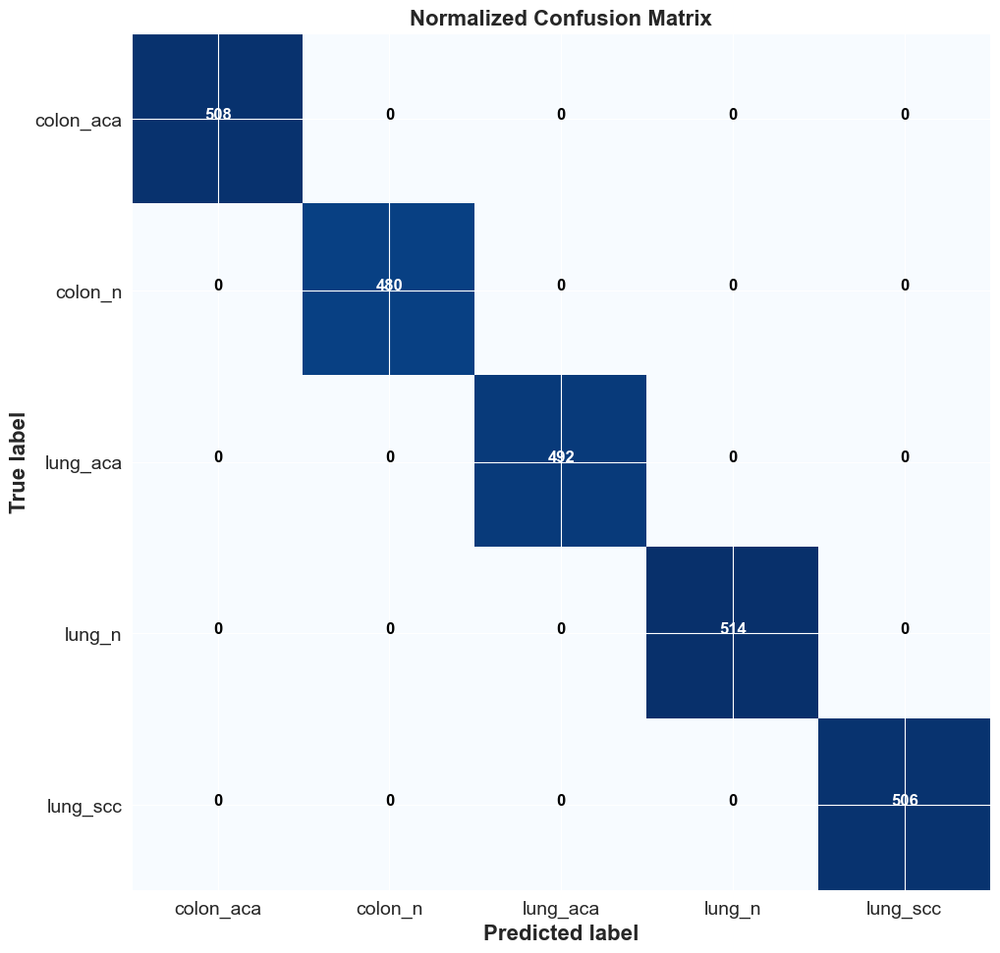

In [36]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("qNormalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, weight='bold', fontsize=16)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=14)
    plt.yticks(tick_marks, classes, fontsize=14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center", fontsize=12, weight='bold',
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', fontsize=16, weight='bold')
    plt.xlabel('Predicted label', fontsize=16, weight='bold')

# Compute confusion matrix
cnf_matrix = confusion_matrix(valid_gen.labels, y_pred)
np.set_printoptions(precision=4)

# Plot non-normalized confusion matrix
plt.figure(figsize=(10, 10))
plot_confusion_matrix(cnf_matrix, classes=['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc'],normalize=False,
                      title='Normalized Confusion Matrix')
plt.show()

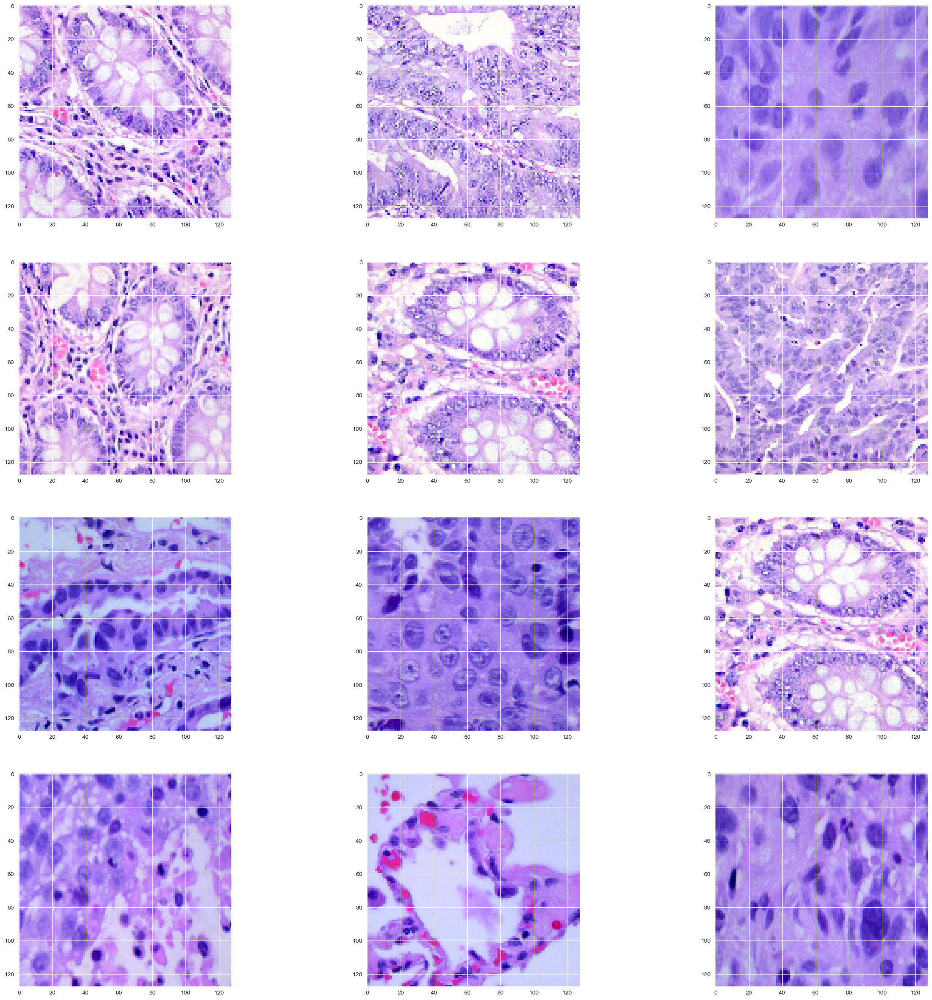

In [37]:
batch_size=32
fig,ax=plt.subplots(4,3)
fig.set_size_inches(30,30)
for next_element in train_gen:
    x_batch, y_batch = next_element
    #print(y_batch)
    for i in range (0,4):
        for j in range(3):
            random_example = np.random.randint(0, batch_size)
            ax[i,j].imshow(x_batch[random_example]/255)
            #ax[i,j].set_title(class_name)
    break
    


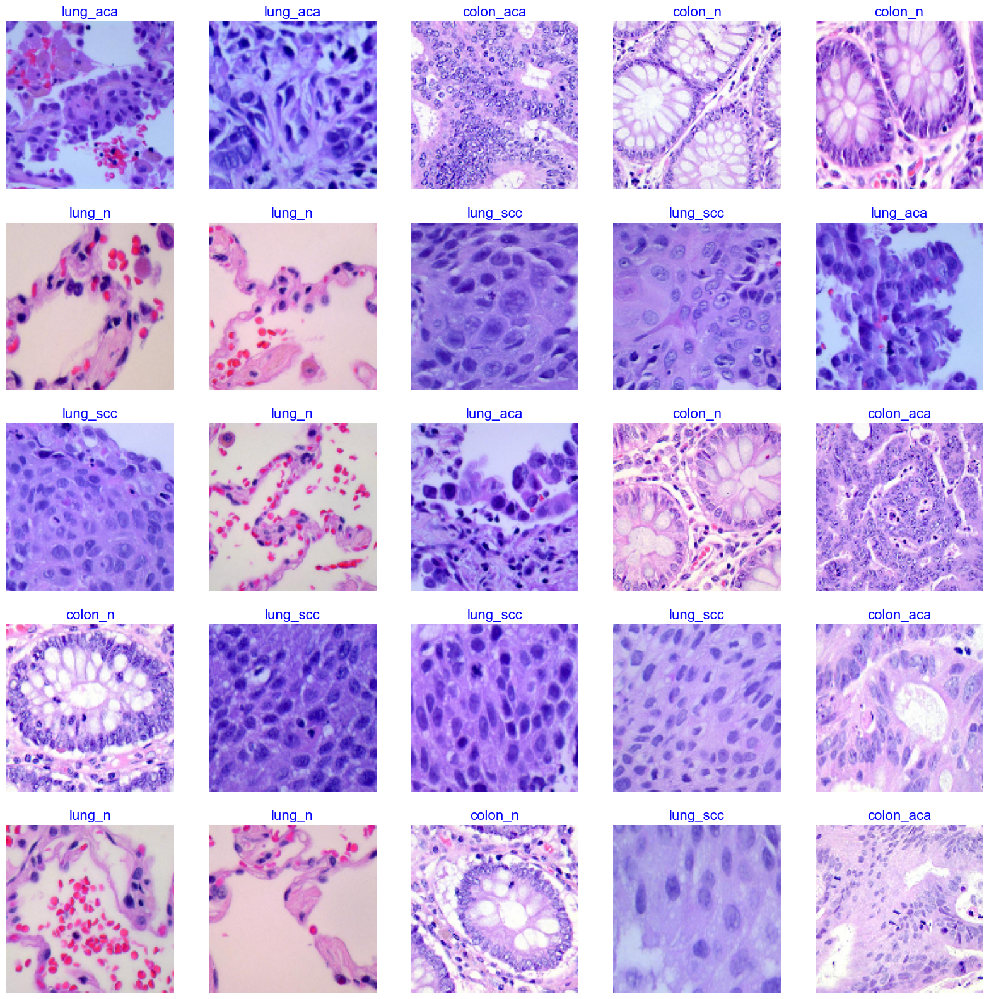

In [46]:
test_dict=test_gen.class_indices
classes=list(test_dict.keys())  
x_batch,labels=next(valid_gen) # get a sample batch from the generator 
plt.figure(figsize=(20, 20))
length=len(labels)
if length<25:   #show maximum of 25 images
     r=length
else:
        r=25
for i in range(r):
        plt.subplot(5, 5, i + 1)
        #image=(images[i]+1 )/2 # scale images between 0 and 1 becaue pre-processor set them between -1 and +1
        plt.imshow(x_batch[i]/255)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=16)
        plt.axis('off')
plt.show()

In [47]:
!pip install lime

                                              0.0/275.7 kB ? eta -:--:--
     --                                       20.5/275.7 kB ? eta -:--:--
     ----                                  30.7/275.7 kB 660.6 kB/s eta 0:00:01
     ----                                  30.7/275.7 kB 660.6 kB/s eta 0:00:01
     ------                                51.2/275.7 kB 262.6 kB/s eta 0:00:01
     ---------                             71.7/275.7 kB 302.7 kB/s eta 0:00:01
     -------------                        102.4/275.7 kB 392.2 kB/s eta 0:00:01
     -------------                        102.4/275.7 kB 392.2 kB/s eta 0:00:01
     --------------------                 153.6/275.7 kB 437.1 kB/s eta 0:00:01
     -----------------------------        225.3/275.7 kB 550.0 kB/s eta 0:00:01
     ------------------------------       235.5/275.7 kB 554.9 kB/s eta 0:00:01
     ------------------------------------ 275.7/275.7 kB 547.4 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing 

In [48]:
import lime
from lime import lime_image
explainer = lime_image.LimeImageExplainer()

In [49]:
explanation = explainer.explain_instance(x_batch[15], model.predict, top_labels=5, hide_color=0, num_samples=10000)

  0%|          | 0/10000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 310ms/step


1/1 [==============================] - 0s 262ms/step


1/1 [==============================] - 0s 283ms/step


1/1 [==============================] - 0s 305ms/step


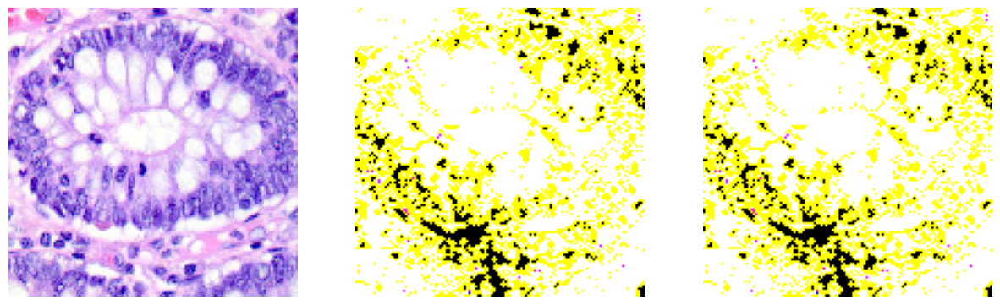

In [50]:
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10000, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10000, hide_rest=True)
#plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
fig, (ax,ax1, ax2) = plt.subplots(1, 3, figsize=(15,15))
ax.imshow(x_batch[15]/255)
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))

ax.axis('off')
ax1.axis('off')
ax2.axis('off')

plt.savefig('mask_default.png')

In [51]:
import lime
from lime import lime_image
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(x_batch[1], model.predict, top_labels=5, hide_color=0, num_samples=10000)

  0%|          | 0/10000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 277ms/step


1/1 [==============================] - 0s 313ms/step


1/1 [==============================] - 0s 327ms/step


1/1 [==============================] - 0s 289ms/step


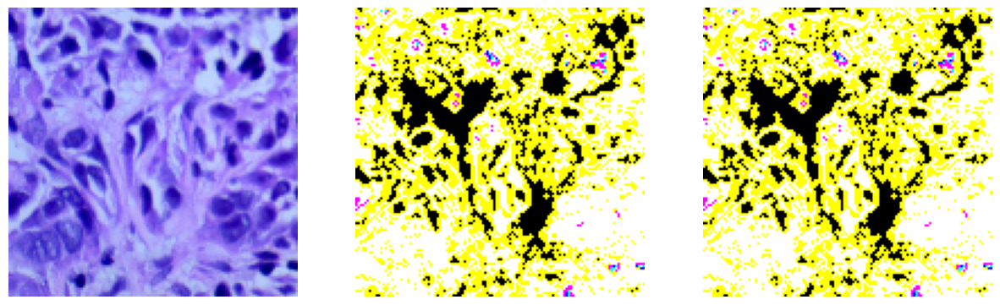

In [52]:
from skimage.segmentation import mark_boundaries
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10000, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10000, hide_rest=True)
#plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
fig, (ax,ax1, ax2) = plt.subplots(1, 3, figsize=(15,15))
ax.imshow(x_batch[1]/255)
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))

ax.axis('off')
ax1.axis('off')
ax2.axis('off')

plt.savefig('mask_default.png')

In [57]:
!pip install shap


import shap
masker = shap.maskers.Image("blur(28,28)", x_batch[0].shape)
explainer = shap.Explainer(model, masker, output_names=classes)
explainer

                                              0.0/448.0 kB ? eta -:--:--
     --                                    30.7/448.0 kB 660.6 kB/s eta 0:00:01
     --                                    30.7/448.0 kB 660.6 kB/s eta 0:00:01
     ---                                   41.0/448.0 kB 196.9 kB/s eta 0:00:03
     ------                                81.9/448.0 kB 353.1 kB/s eta 0:00:02
     ---------                            112.6/448.0 kB 409.6 kB/s eta 0:00:01
     ---------                            122.9/448.0 kB 359.9 kB/s eta 0:00:01
     -------------                        163.8/448.0 kB 446.5 kB/s eta 0:00:01
     ----------------                     204.8/448.0 kB 497.6 kB/s eta 0:00:01
     -------------------                  245.8/448.0 kB 558.1 kB/s eta 0:00:01
     --------------------                 256.0/448.0 kB 524.0 kB/s eta 0:00:01
     ------------------------             307.2/448.0 kB 542.9 kB/s eta 0:00:01
     ----------------------------         358.4

In [58]:
shap_values = explainer(x_batch[0:8], outputs=shap.Explanation.argsort.flip[:5])
shap_values.shape

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  12%|███████▊                                                      | 1/8 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  38%|████████████████████▎                                 | 3/8 [01:17<01:31, 18.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|███████████████████████████                           | 4/8 [01:54<01:44, 26.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  62%|█████████████████████████████████▊                    | 5/8 [02:34<01:33, 31.09s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|████████████████████████████████████████▌             | 6/8 [03:13<01:08, 34.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|███████████████████████████████████████████████▎      | 7/8 [03:51<00:35, 35.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████████████████████████████████████████████████| 8/8 [04:29<00:00, 36.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 9it [05:07, 38.47s/it]                                                                   


(8, 128, 128, 3, 5)

In [59]:
print("Actual Labels    : {}".format(np.argmax(y_batch[0:8], axis=1)))
probs = model.predict(x_batch[0:8])
print("Predicted Labels : {}".format( np.argmax(probs, axis=1)))
print("Probabilities : {}".format(np.max(probs, axis=1)))

Actual Labels    : [3 0 1 4 4 2 2 4]
1/1 [==============================] - 0s 273ms/step
Predicted Labels : [2 2 0 1 1 3 3 4]
Probabilities : [0.9961 0.9977 0.9987 0.998  0.9981 0.9984 0.9992 0.994 ]


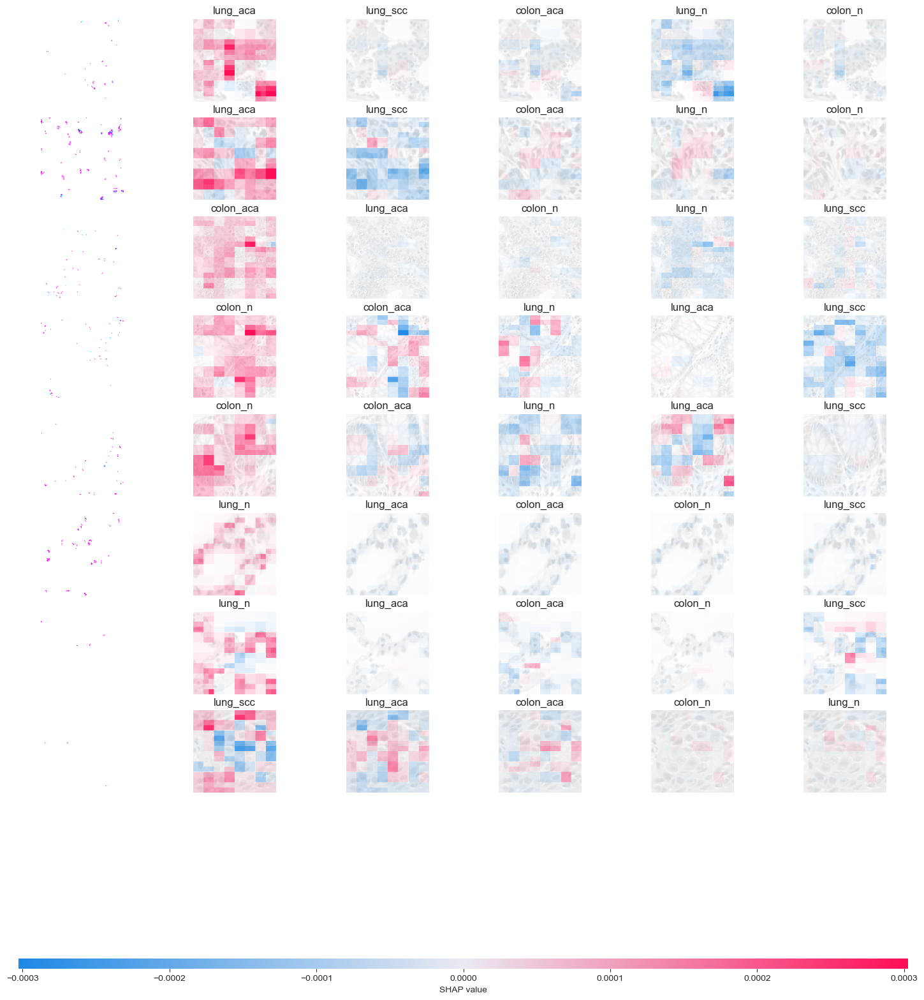

In [60]:
shap.image_plot(shap_values)